In [1]:
import numpy as np
import tensorflow as tf

import os
# np.random.seed(1337)  # for reproducibility
# tf.random.set_seed(1337)
# os.environ['TF_DETERMINISTIC_OPS'] = '1'
# os.environ['TF_CUDNN_DETERMINISTIC '] = '1'


# os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
# os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

In [2]:
base_coin_str = 'BTC'
base_coin_fullname_str = 'bitcoin'

In [3]:
from data.utils import load_data
from data.scaling import normalize

filtro_tipos_eventos_permitidos = ['listing', 'launch', 'fork']
query_str = 'title.isna()'
for filtro in filtro_tipos_eventos_permitidos:
    query_str += f' or title.str.lower().str.contains("{filtro}")'
    # df = df.query(f'event_title.isna() or event_title.str.lower().str.contains("{filtro}")')
print(query_str)

title.isna() or title.str.lower().str.contains("listing") or title.str.lower().str.contains("launch") or title.str.lower().str.contains("fork")


In [4]:
df = load_data(base_coin_str, base_coin_fullname_str, event_days_left_lookback=7, storage_folder='../data', events_query=query_str)
prices, _ = normalize(df.loc[:, 'price'].to_numpy())
variation = df.loc[:, 'price (%)'].to_numpy()
# variation = df.loc[:, 'price'].pct_change().fillna(0).to_numpy()
volume, _ = normalize(df['Volume'].to_numpy())
volume_variation = df['Volume'].pct_change().fillna(0).to_numpy()
tweet, _ = normalize(df.loc[:, 'tweet_volume'].to_numpy())
tweet_variation = df.loc[:, 'tweet_volume'].pct_change().fillna(0).to_numpy()
google_trends, _ = normalize(df.loc[:, 'trend'].to_numpy())
google_trends_variation = df.loc[:, 'trend'].pct_change().fillna(0).to_numpy()

In [5]:
from typing import Tuple
# look_behind: passos (dias) anteriores usados para prever o proximo.
N = 30
foward_days = 1  # quantos dias prever

def to_keras_format(features: list, target) -> Tuple[np.array, np.array]:
    n_samples = len(target) - N - (foward_days-1)
    # matriz de dimensao: [n_samples, N, n_features];
    features_set = np.empty((n_samples, N, len(features)))  # type: np.ndarray
    labels = [None]*n_samples
    for i in range(n_samples):
        for j in range(N):
            for ft_idx in range(len(features)):
                feature = features[ft_idx]
                features_set[i, j, ft_idx] = feature[i+j]

        labels[i] = target[N+i-1: N+i+foward_days]
    labels = np.array(labels)

    return features_set, labels

In [6]:
from keras.models import Model
from keras.layers import Input, LSTM, Dropout, Dense

def build_model(train_X, train_y) -> Model:
    inputs = Input(shape=train_X.shape[1:])
    lstm = LSTM(units=750, return_sequences=False, input_shape=train_X.shape[1:])(inputs)
    lstm = Dropout(0.1)(lstm)
    x = Dense(units=175, activation='linear')(lstm)
    x = Dropout(0.1)(x)
    x = Dense(units=75, activation='linear')(x)
    x = Dropout(0.1)(x)
    x = Dense(units=foward_days)(x)
    return Model(inputs=inputs, outputs=x)

In [7]:
from matplotlib import pyplot as plt
# vizualizando estatisticas do modelo em si e seu treino
def plot_train_history(modelo: Model, plot_above_or_below_zero_accuracy: bool, plotValidation = True, figsize=(25,10)):
    plt.rcParams['figure.figsize'] = figsize
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)

    ax1.plot(modelo.history.history['loss'])
    if plotValidation: ax1.plot(modelo.history.history['val_loss'])
    ax1.title.set_text('model loss')
    ax1.set_ylabel('loss')
    ax1.set_xlabel('epoch')
    ax1.legend(['train', 'test'], loc='upper left')

    ax2.plot(modelo.history.history['mean_squared_error'])
    if plotValidation: ax2.plot(modelo.history.history['val_mean_squared_error'])
    ax2.title.set_text('model meanSquaredError')
    ax2.set_ylabel('mse')
    ax2.set_xlabel('epoch')
    ax2.legend(['train', 'test'], loc='upper left')

    ax3.plot(modelo.history.history['movement_accuracy'])
    if plotValidation: ax3.plot(modelo.history.history['val_movement_accuracy'])
    ax3.title.set_text('model movement direction accuracy')
    ax3.set_ylabel('accuracy')
    ax3.set_xlabel('epoch')
    ax3.legend(['train', 'test'], loc='upper left')

    # plote esse apenas se seu dado target for de variação (não faz sentido para dado bruto)
    if plot_above_or_below_zero_accuracy:
        ax4.plot(modelo.history.history['above_or_below_zero_accuracy'])
        if plotValidation: ax4.plot(modelo.history.history['val_above_or_below_zero_accuracy'])
        ax4.title.set_text('price up or down accuracy *')
        ax4.set_ylabel('accuracy')
        ax4.set_xlabel('epoch')
        ax4.legend(['train', 'test'], loc='upper left')
    
    plt.tight_layout()
    plt.show()

In [8]:
# tf.keras.backend.clear_session() #limpa modelos e dados anteriores, para evitar vazamento de memoria
from metrics.custom import above_or_below_zero_accuracy, movement_accuracy
from metrics.custom import mean_squared_error, cosine_similarity as custom_cosine_similarity, mean_absolute_percentage_error
from metrics.custom import RootMeanSquaredError

from sklearn.model_selection import KFold, RepeatedKFold
from shutil import rmtree

def get_model_name(k, n_repeat = None):
    if n_repeat:
        return 'model_'+str(k)+'_'+str(n_repeat)+'.h5'
    return 'model_'+str(k)+'.h5'

def build_and_run_and_show(features, target, loss_function, shuffle_mask=None, epochs=600, batch_size=128) -> Model:
    save_dir = './tmp_altcoins/saved_models/'
    if os.path.exists(save_dir):
        rmtree(save_dir)

    features_set, labels = to_keras_format(features, target)

    if shuffle_mask == None:
        shuffle_mask = np.arange(len(features_set))
        np.random.shuffle(shuffle_mask)

    unshuffle_mask = np.zeros(len(shuffle_mask), dtype=int)
    for i in range(len(shuffle_mask)):
        unshuffle_mask[shuffle_mask[i]] = i

    features_set, labels = features_set[shuffle_mask], labels[shuffle_mask]

    
    TEST_MSE = []
    TEST_MOV_ACCURACY = []
    TEST_UPDOWN_ACCURACY = []
    # kf = KFold(n_splits = 5)
    n_repeats = 2
    kf = RepeatedKFold(n_splits = 5, n_repeats = n_repeats, random_state=1337) # random_state fixo para manter reproducibilidade entre chamadas dessa função

    fold_num = 1
    repeat_num = 1
    for train_index, test_index  in kf.split(features_set, labels):
        tf.keras.backend.clear_session()

        train_X, train_y = features_set[train_index], labels[train_index]
        test_X, test_y = features_set[test_index], labels[test_index]

        model = build_model(train_X, train_y)
        opt = tf.keras.optimizers.Adam(learning_rate=0.001, amsgrad=True)
        model.compile(optimizer=opt, loss=loss_function, metrics=[mean_squared_error, movement_accuracy, above_or_below_zero_accuracy])# 'cosine_similarity', 'mean_squared_error'

        # CREATE CALLBACKS
        best_mse_checkpoint = tf.keras.callbacks.ModelCheckpoint(save_dir+'mse/'+get_model_name(fold_num, repeat_num),#+'_{epoch:03d}-{val_mean_squared_error:.5f}', 
                                monitor='val_mean_squared_error', verbose=0, save_best_only=True, mode='min')
        best_movAcc_checkpoint = tf.keras.callbacks.ModelCheckpoint(save_dir+'mov_accuracy/'+get_model_name(fold_num, repeat_num),#+'_{epoch:03d}-{val_movement_accuracy:.5f}', 
                                monitor='val_movement_accuracy', verbose=0, save_best_only=True, mode='max')
        best_above_below_zero_checkpoint = tf.keras.callbacks.ModelCheckpoint(save_dir+'above_or_below_zero_accuracy/'+get_model_name(fold_num, repeat_num),#+'_{epoch:03d}-{val_movement_accuracy:.5f}', 
                                monitor='val_above_or_below_zero_accuracy', verbose=0, save_best_only=True, mode='max')
        checkpoints = [best_mse_checkpoint, best_movAcc_checkpoint, best_above_below_zero_checkpoint]

        print(f'treinando fold {fold_num}, repetição {repeat_num} (400 epochs dá 2min +-)')
        model.fit(train_X, train_y, validation_data=(test_X, test_y), epochs=epochs, batch_size=batch_size, callbacks=checkpoints, verbose=0)
        

        # PLOT HISTORY
        plot_train_history(model, plot_above_or_below_zero_accuracy=True, figsize=(25,8))

        # LOAD BEST MODEL (for specific metric) to evaluate the performance of the model
        model.load_weights(save_dir+"mse/"+get_model_name(fold_num, repeat_num))
        results = model.evaluate(x=test_X, y=test_y, batch_size=1)
        results = dict(zip(model.metrics_names, results))
        TEST_MSE.append(results['mean_squared_error'])
        
        model.load_weights(save_dir+"mov_accuracy/"+get_model_name(fold_num, repeat_num))
        results = model.evaluate(x=test_X, y=test_y, batch_size=1)
        results = dict(zip(model.metrics_names, results))
        TEST_MOV_ACCURACY.append(results['movement_accuracy'])

        model.load_weights(save_dir+"above_or_below_zero_accuracy/"+get_model_name(fold_num, repeat_num))
        results = model.evaluate(x=test_X, y=test_y, batch_size=1)
        results = dict(zip(model.metrics_names, results))
        TEST_UPDOWN_ACCURACY.append(results['above_or_below_zero_accuracy'])

        if repeat_num % n_repeats == 0:
            fold_num +=1
            repeat_num = 1
        else:    
            repeat_num += 1        

        rmtree(save_dir)
        tf.keras.backend.clear_session()

    print('\nResults:\n')
    print(f'MeanSquaredError: {TEST_MSE}')
    print(f'MovementDiretionAccuracy: {TEST_MOV_ACCURACY}')
    print(f'AboveOrBellowAccuracy: {TEST_UPDOWN_ACCURACY}\n')
    print(f'MeanSquaredError mean: {np.mean(TEST_MSE)}')
    print(f'MovementDiretionAccuracy mean: {np.mean(TEST_MOV_ACCURACY)}')
    print(f'AboveOrBellowAccuracy mean: {np.mean(TEST_UPDOWN_ACCURACY)}\n')
    print(f'MeanSquaredError std: {np.std(TEST_MSE)}')
    print(f'MovementDiretionAccuracy std: {np.std(TEST_MOV_ACCURACY)}')
    print(f'AboveOrBellowAccuracy std: {np.std(TEST_UPDOWN_ACCURACY)}')

    return

In [9]:
import cv2
def plot_predictions_and_save(testPredict: np.array, test_y: np.array, base_coin:str, alternative_coin:str):
    predictions = testPredict
    targets_test = test_y[:, -1:].tolist()
    # prediction tem um shape (samples, foward_days), entao vamos pegar previsoes de foward_days dias, a cada partir de pontos com intervalo de foward_days
    foward_days_predictions = []
    for i in range(1, predictions.shape[0], foward_days):
        foward_days_predictions.append(np.array([None]*(i-1) + targets_test[i-1] +
                                                predictions[i].tolist() +
                                                [None]*(predictions.shape[0]-(i+foward_days))))

    fig = plot_data([targets_test] + foward_days_predictions, tick=10, legends=['target', 'prediction'],
                        colors=['b', 'r'] + ['r']*len(foward_days_predictions), blocking=False, figsize=(160,20))
    fig.savefig('1.png')
    # 1 day predictions
    fig = plot_data([targets_test, predictions[:, 0]], tick=10, legends=['target', 'prediction'], blocking=False, figsize=(160,20))
    fig.savefig('2.png')

    im_v = cv2.vconcat([cv2.imread('1.png'), cv2.imread('2.png')])
    if not os.path.exists('../resultados/generic_model/'):
        os.mkdir('../resultados/generic_model/')
    cv2.imwrite(f'../resultados/generic_model/{base_coin} trained - {alternative_coin} forecasting.png', im_v)


def plot_predictions(testPredict: np.array, test_y: np.array):
    predictions = testPredict
    targets_test = test_y[:, -1:].tolist()
    # prediction tem um shape (samples, foward_days), entao vamos pegar previsoes de foward_days dias, a cada partir de pontos com intervalo de foward_days
    foward_days_predictions = []
    for i in range(1, predictions.shape[0], foward_days):
        foward_days_predictions.append(np.array([None]*(i-1) + targets_test[i-1] +
                                                predictions[i].tolist() +
                                                [None]*(predictions.shape[0]-(i+foward_days))))

    plot_data([targets_test] + foward_days_predictions, tick=10, legends=['target', 'prediction'],
                        colors=['b', 'r'] + ['r']*len(foward_days_predictions), blocking=False, figsize=(160,20))
    # 1 day predictions
    plot_data([targets_test, predictions[:, 0]], tick=10, legends=['target', 'prediction'], blocking=False, figsize=(160,30))

# Treina valores brutos, com K-Fold

treinando fold 1, repetição 1 (400 epochs dá 2min +-)


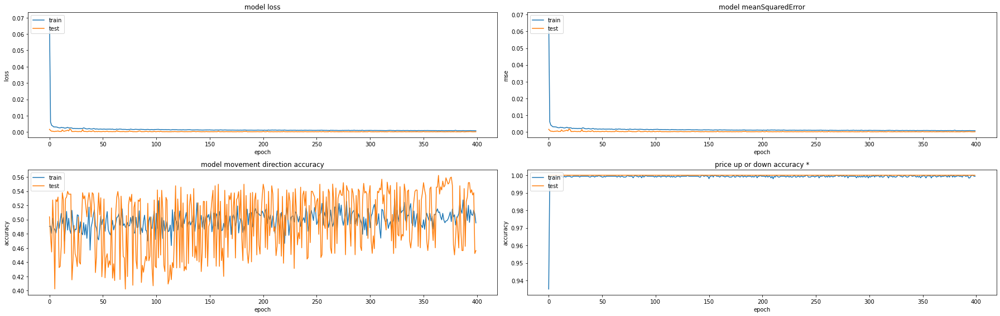

498/498 [==============================] - 3s 7ms/step - loss: 0.0017 - mean_squared_error: 0.0017 - movement_accuracy: 0.5020 - above_or_below_zero_accuracy: 1.0000
treinando fold 1, repetição 2 (400 epochs dá 2min +-)


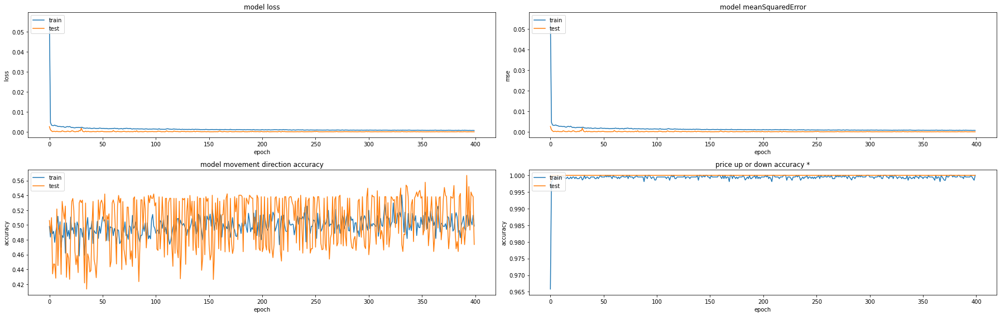

498/498 [==============================] - 3s 7ms/step - loss: 0.0011 - mean_squared_error: 0.0011 - movement_accuracy: 0.4900 - above_or_below_zero_accuracy: 1.0000
treinando fold 2, repetição 1 (400 epochs dá 2min +-)


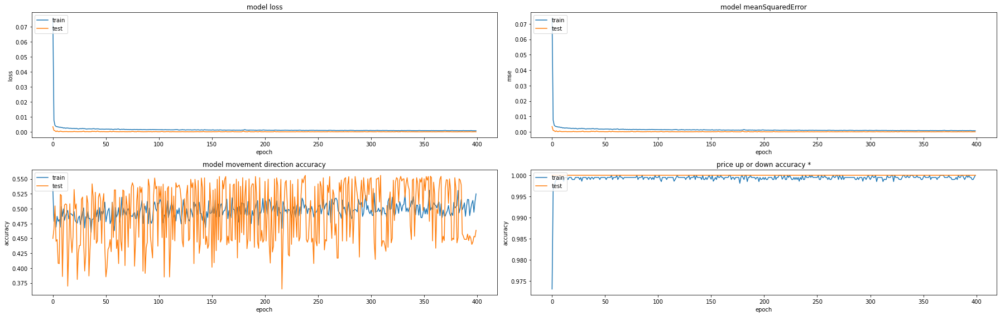

497/497 [==============================] - 3s 7ms/step - loss: 0.0035 - mean_squared_error: 0.0035 - movement_accuracy: 0.4507 - above_or_below_zero_accuracy: 1.0000
treinando fold 2, repetição 2 (400 epochs dá 2min +-)


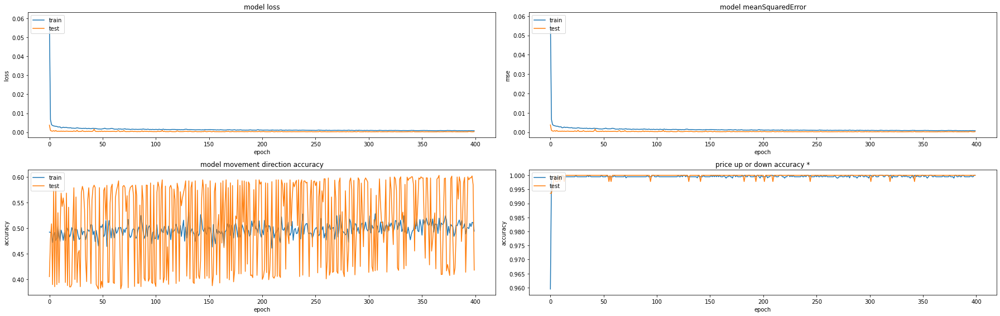

497/497 [==============================] - 3s 7ms/step - loss: 7.7607e-04 - mean_squared_error: 7.7607e-04 - movement_accuracy: 0.5755 - above_or_below_zero_accuracy: 1.0000
treinando fold 3, repetição 1 (400 epochs dá 2min +-)


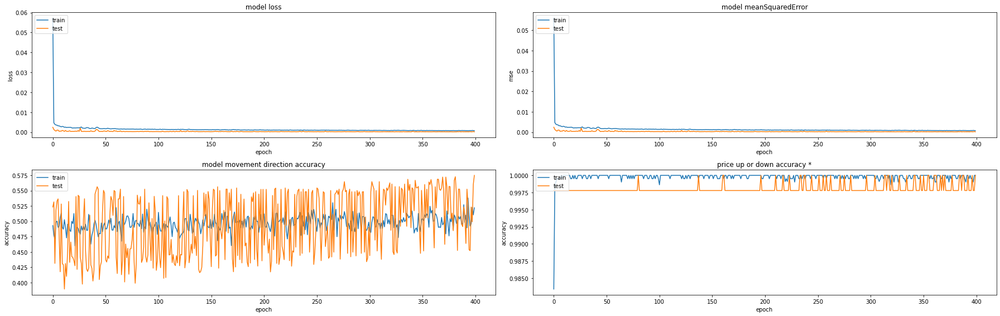

497/497 [==============================] - 4s 7ms/step - loss: 3.6009e-04 - mean_squared_error: 3.6009e-04 - movement_accuracy: 0.5392 - above_or_below_zero_accuracy: 1.0000
treinando fold 3, repetição 2 (400 epochs dá 2min +-)


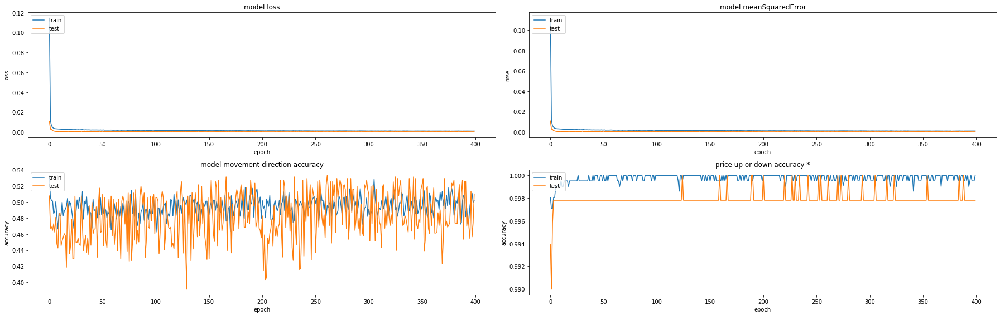

498/498 [==============================] - 3s 7ms/step - loss: 1.9566e-04 - mean_squared_error: 1.9566e-04 - movement_accuracy: 0.5241 - above_or_below_zero_accuracy: 1.0000
treinando fold 4, repetição 1 (400 epochs dá 2min +-)


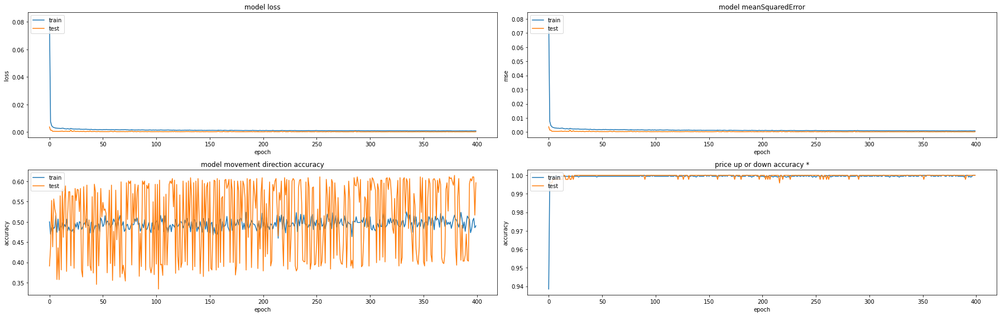

498/498 [==============================] - 3s 7ms/step - loss: 4.9373e-04 - mean_squared_error: 4.9373e-04 - movement_accuracy: 0.5562 - above_or_below_zero_accuracy: 1.0000
treinando fold 4, repetição 2 (400 epochs dá 2min +-)


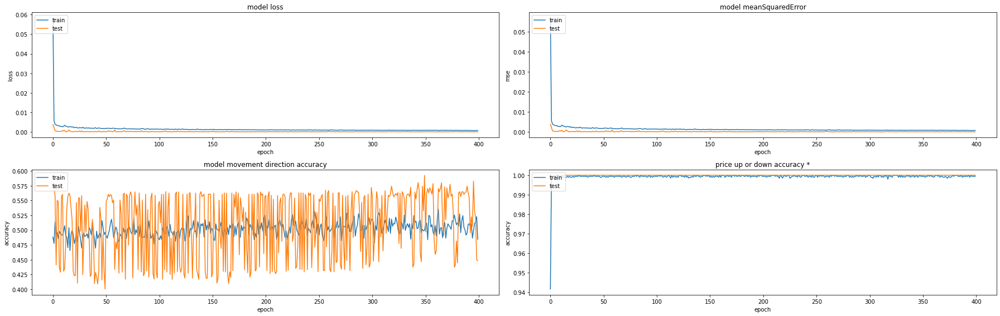

497/497 [==============================] - 3s 7ms/step - loss: 0.0038 - mean_squared_error: 0.0038 - movement_accuracy: 0.5755 - above_or_below_zero_accuracy: 1.0000
treinando fold 5, repetição 1 (400 epochs dá 2min +-)


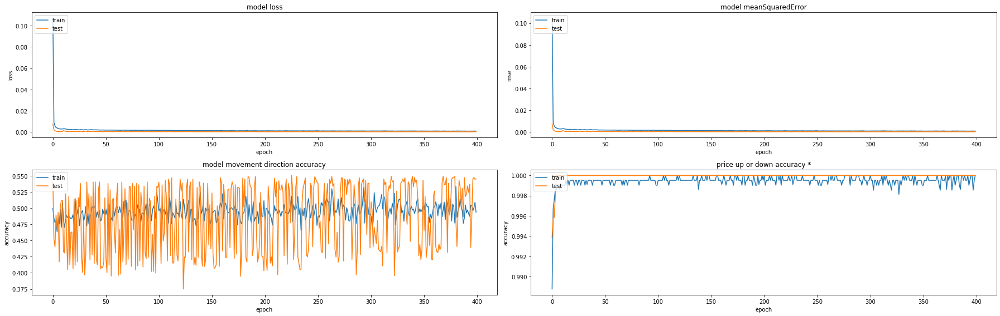

497/497 [==============================] - 3s 7ms/step - loss: 5.5969e-04 - mean_squared_error: 5.5969e-04 - movement_accuracy: 0.4688 - above_or_below_zero_accuracy: 1.0000
treinando fold 5, repetição 2 (400 epochs dá 2min +-)


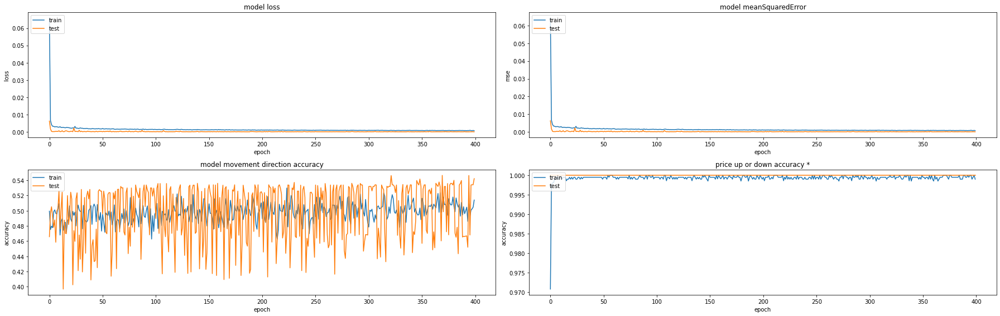

497/497 [==============================] - 3s 7ms/step - loss: 0.0063 - mean_squared_error: 0.0063 - movement_accuracy: 0.4668 - above_or_below_zero_accuracy: 1.0000

Results:

MeanSquaredError: [0.00010157722135772929, 7.271151116583496e-05, 6.843963637948036e-05, 0.00016113612218759954, 0.00016305877943523228, 0.00010613721678964794, 0.00018339097732678056, 7.002885831752792e-05, 0.00018164675566367805, 8.951377094490454e-05]
MovementDiretionAccuracy: [0.5602409839630127, 0.5682730674743652, 0.5553320050239563, 0.6036217212677002, 0.5714285969734192, 0.5321285128593445, 0.6144578456878662, 0.591549277305603, 0.5492957830429077, 0.5472837090492249]
AboveOrBellowAccuracy: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

MeanSquaredError mean: 0.00011976408495684154
MovementDiretionAccuracy mean: 0.56936115026474
AboveOrBellowAccuracy mean: 1.0

MeanSquaredError std: 4.4963534039818054e-05
MovementDiretionAccuracy std: 0.025023121138778505
AboveOrBellowAccuracy std: 0.0


NameError: name 'coin_fullname_str' is not defined

In [11]:
features = [prices]
target = prices

build_and_run_and_show(features, target, mean_squared_error, epochs = 600)  # nao teve overfitting até o epoch 400, entao bora forçar mais uns pra ver se tira mais ganho
print(f'Esse é o score do {base_coin_fullname_str} num modelo treinado por ele mesmo (mesma moeda, mas trechos de dados diferentes)\n foi usada validação cruzada (K-Fold)')

treinando fold 1, repetição 1 (400 epochs dá 2min +-)


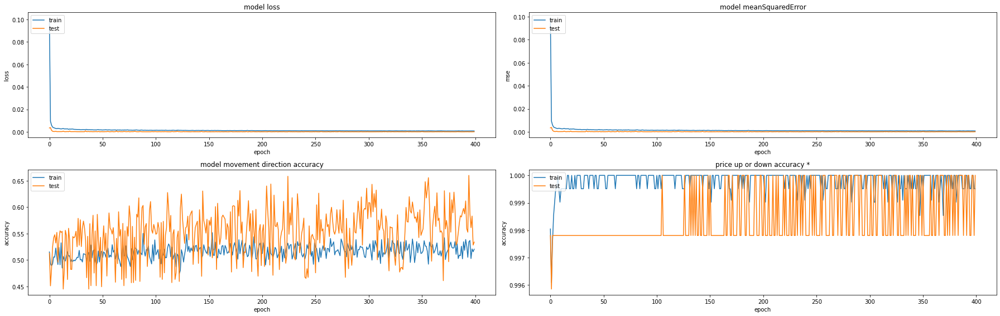

498/498 [==============================] - 4s 7ms/step - loss: 1.3700e-04 - mean_squared_error: 1.3700e-04 - movement_accuracy: 0.5703 - above_or_below_zero_accuracy: 1.0000
treinando fold 1, repetição 2 (400 epochs dá 2min +-)


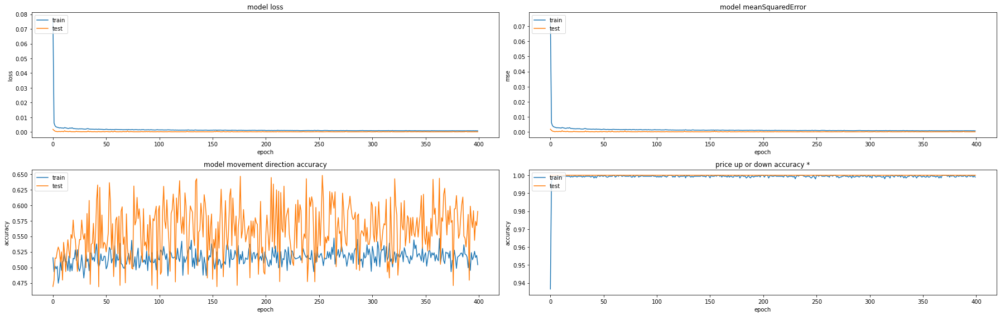

498/498 [==============================] - 4s 7ms/step - loss: 0.0018 - mean_squared_error: 0.0018 - movement_accuracy: 0.4699 - above_or_below_zero_accuracy: 1.0000
treinando fold 2, repetição 1 (400 epochs dá 2min +-)


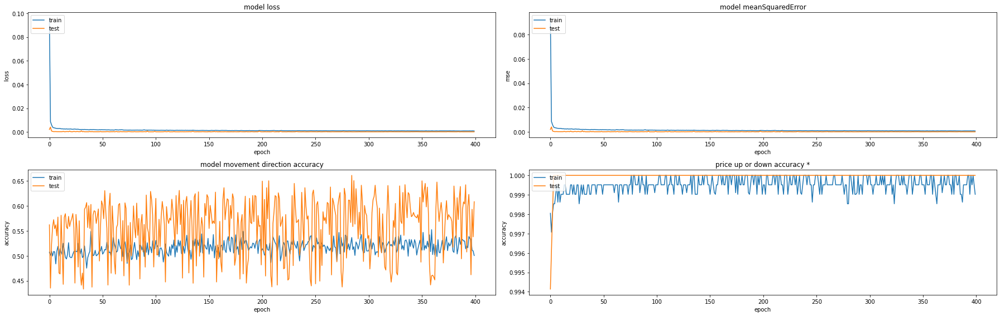

497/497 [==============================] - 3s 7ms/step - loss: 4.6204e-04 - mean_squared_error: 4.6204e-04 - movement_accuracy: 0.5573 - above_or_below_zero_accuracy: 1.0000
treinando fold 2, repetição 2 (400 epochs dá 2min +-)


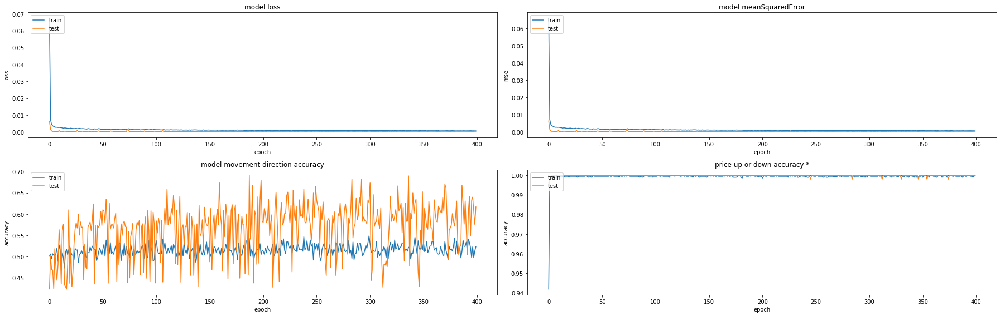

497/497 [==============================] - 3s 7ms/step - loss: 3.9472e-04 - mean_squared_error: 3.9472e-04 - movement_accuracy: 0.4688 - above_or_below_zero_accuracy: 1.0000
treinando fold 3, repetição 1 (400 epochs dá 2min +-)


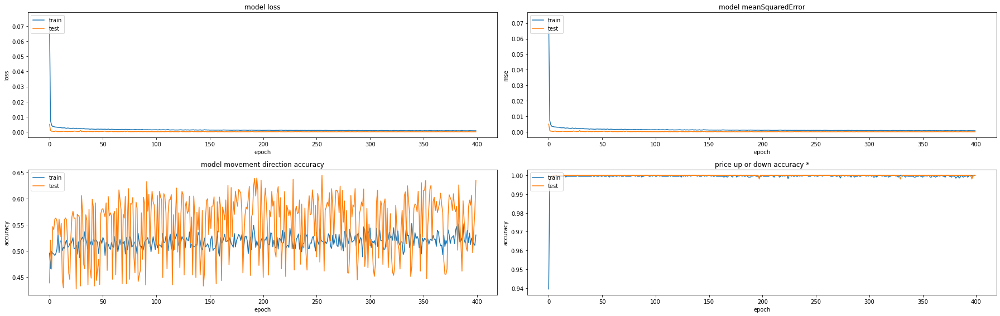

497/497 [==============================] - 3s 7ms/step - loss: 2.4421e-04 - mean_squared_error: 2.4421e-04 - movement_accuracy: 0.5412 - above_or_below_zero_accuracy: 1.0000
treinando fold 3, repetição 2 (400 epochs dá 2min +-)


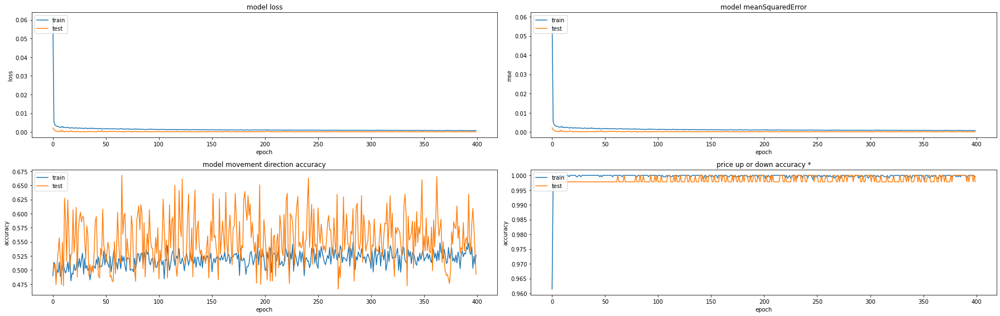

498/498 [==============================] - 3s 7ms/step - loss: 2.0504e-04 - mean_squared_error: 2.0504e-04 - movement_accuracy: 0.5522 - above_or_below_zero_accuracy: 1.0000
treinando fold 4, repetição 1 (400 epochs dá 2min +-)


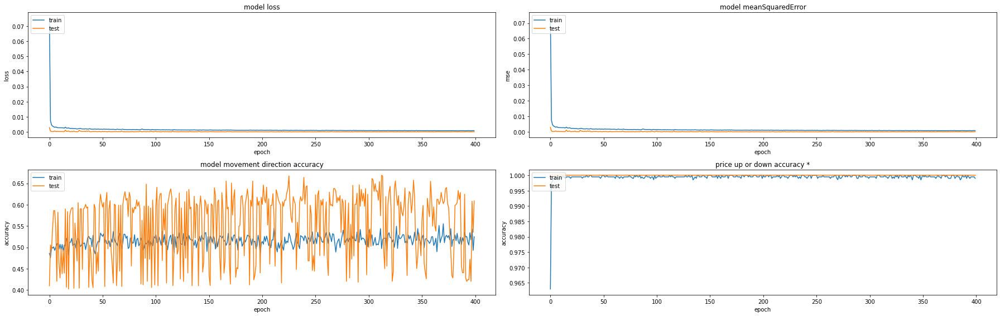

498/498 [==============================] - 3s 7ms/step - loss: 0.0029 - mean_squared_error: 0.0029 - movement_accuracy: 0.4096 - above_or_below_zero_accuracy: 1.0000
treinando fold 4, repetição 2 (400 epochs dá 2min +-)


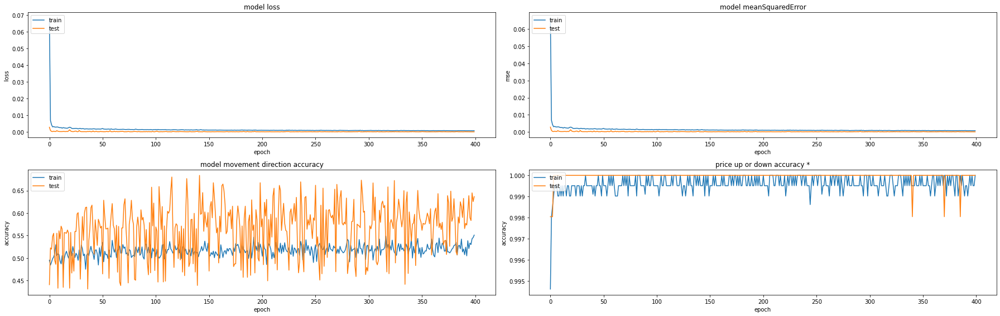

497/497 [==============================] - 3s 7ms/step - loss: 2.6543e-04 - mean_squared_error: 2.6543e-04 - movement_accuracy: 0.5453 - above_or_below_zero_accuracy: 1.0000
treinando fold 5, repetição 1 (400 epochs dá 2min +-)


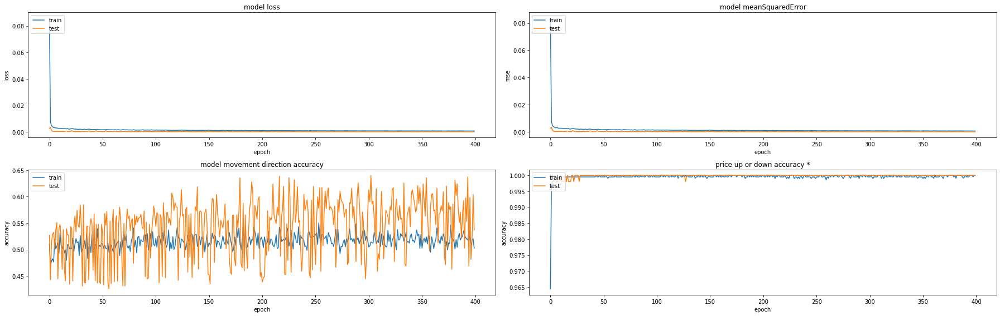

497/497 [==============================] - 3s 7ms/step - loss: 5.4195e-04 - mean_squared_error: 5.4195e-04 - movement_accuracy: 0.5453 - above_or_below_zero_accuracy: 1.0000
treinando fold 5, repetição 2 (400 epochs dá 2min +-)


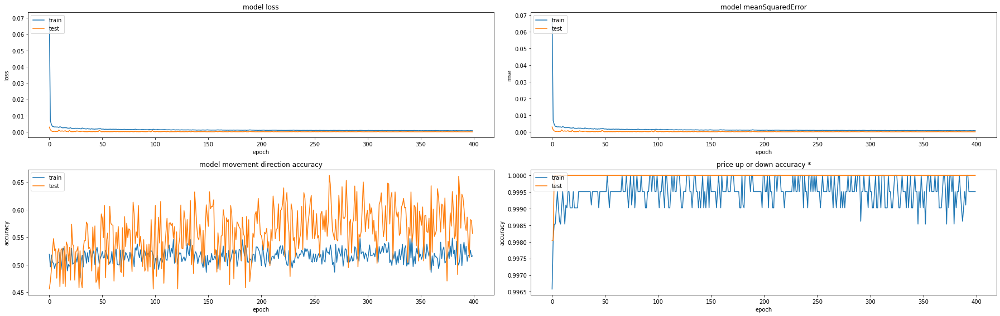

497/497 [==============================] - 4s 7ms/step - loss: 6.5018e-04 - mean_squared_error: 6.5018e-04 - movement_accuracy: 0.4930 - above_or_below_zero_accuracy: 1.0000

Results:

MeanSquaredError: [8.316629100590944e-05, 0.0001073723251465708, 8.681308099767193e-05, 0.00012897764099761844, 5.9795846027554944e-05, 8.05952149676159e-05, 5.190835872781463e-05, 0.00010144506813958287, 0.0001404110953444615, 8.4921826783102e-05]
MovementDiretionAccuracy: [0.6606425642967224, 0.6485943794250488, 0.6599597334861755, 0.6921529173851013, 0.6438632011413574, 0.6686747074127197, 0.6686747074127197, 0.6841046214103699, 0.6398390531539917, 0.6639838814735413]
AboveOrBellowAccuracy: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

MeanSquaredError mean: 9.254067481379025e-05
MovementDiretionAccuracy mean: 0.6630489766597748
AboveOrBellowAccuracy mean: 1.0

MeanSquaredError std: 2.6387743215858224e-05
MovementDiretionAccuracy std: 0.015765834700639483
AboveOrBellowAccuracy std: 0.0
Esse é o 

In [12]:
features = [prices, variation]
target = prices

build_and_run_and_show(features, target, mean_squared_error, epochs = 600)  # nao teve overfitting até o epoch 400, entao bora forçar mais uns pra ver se tira mais ganho
print(f'Esse é o score do {base_coin_fullname_str} num modelo treinado por ele mesmo (mesma moeda, mas trechos de dados diferentes). Foi usada validação cruzada (K-Fold)')

treinando fold 1, repetição 1 (400 epochs dá 2min +-)


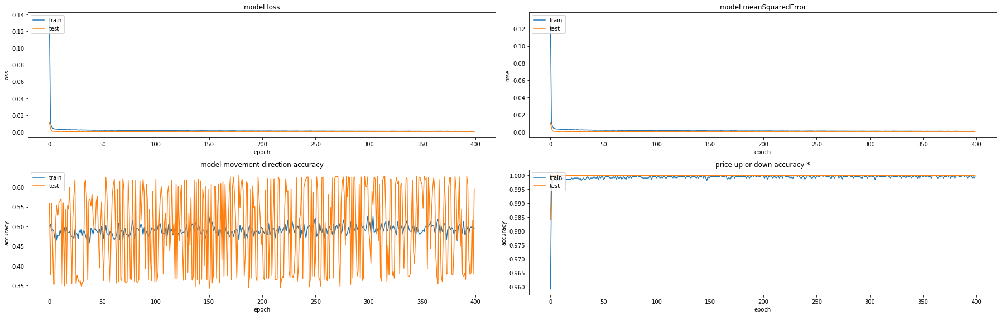

498/498 [==============================] - 4s 7ms/step - loss: 0.0047 - mean_squared_error: 0.0047 - movement_accuracy: 0.3775 - above_or_below_zero_accuracy: 1.0000
treinando fold 1, repetição 2 (400 epochs dá 2min +-)


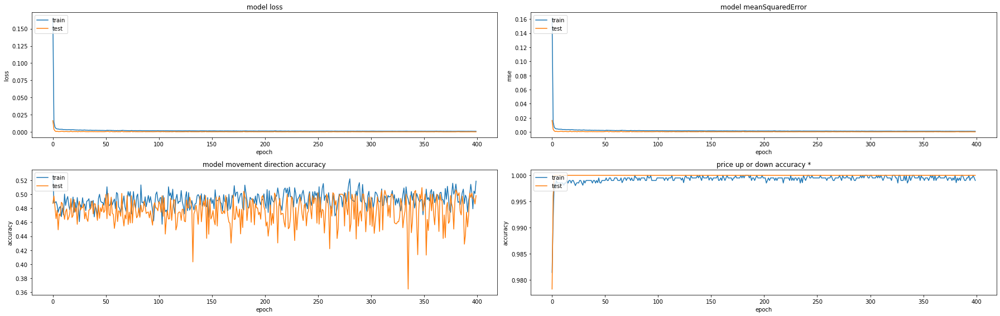

498/498 [==============================] - 4s 7ms/step - loss: 0.0015 - mean_squared_error: 0.0015 - movement_accuracy: 0.4799 - above_or_below_zero_accuracy: 1.0000
treinando fold 2, repetição 1 (400 epochs dá 2min +-)


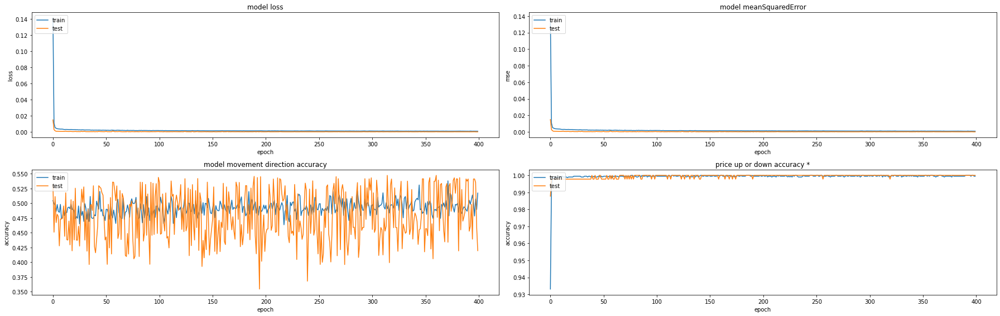

497/497 [==============================] - 4s 7ms/step - loss: 3.0757e-04 - mean_squared_error: 3.0757e-04 - movement_accuracy: 0.4245 - above_or_below_zero_accuracy: 1.0000
treinando fold 2, repetição 2 (400 epochs dá 2min +-)


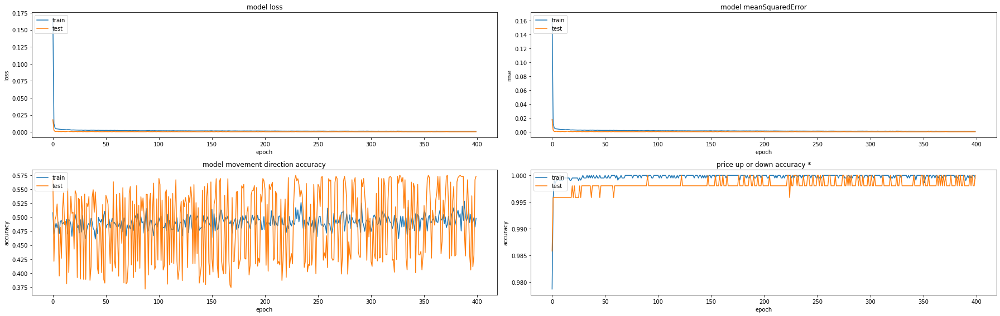

497/497 [==============================] - 4s 7ms/step - loss: 4.3862e-04 - mean_squared_error: 4.3862e-04 - movement_accuracy: 0.3964 - above_or_below_zero_accuracy: 1.0000
treinando fold 3, repetição 1 (400 epochs dá 2min +-)


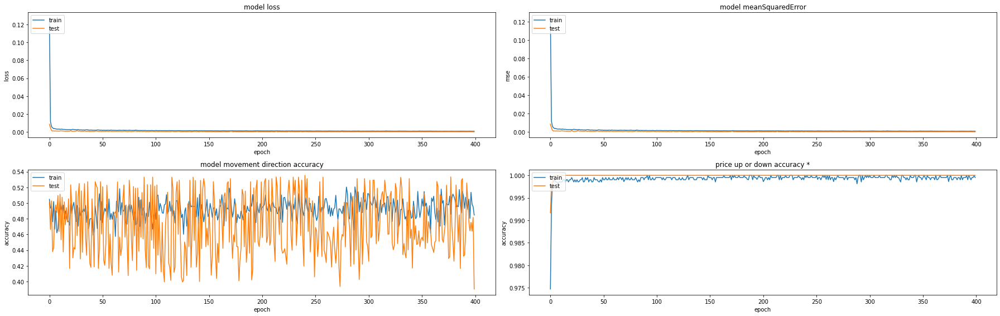

497/497 [==============================] - 3s 7ms/step - loss: 0.0012 - mean_squared_error: 0.0012 - movement_accuracy: 0.4366 - above_or_below_zero_accuracy: 1.0000
treinando fold 3, repetição 2 (400 epochs dá 2min +-)


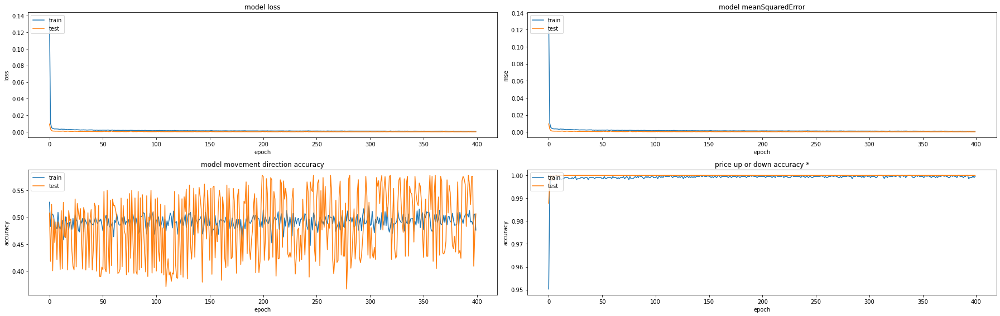

498/498 [==============================] - 4s 7ms/step - loss: 0.0017 - mean_squared_error: 0.0017 - movement_accuracy: 0.5241 - above_or_below_zero_accuracy: 1.0000
treinando fold 4, repetição 1 (400 epochs dá 2min +-)


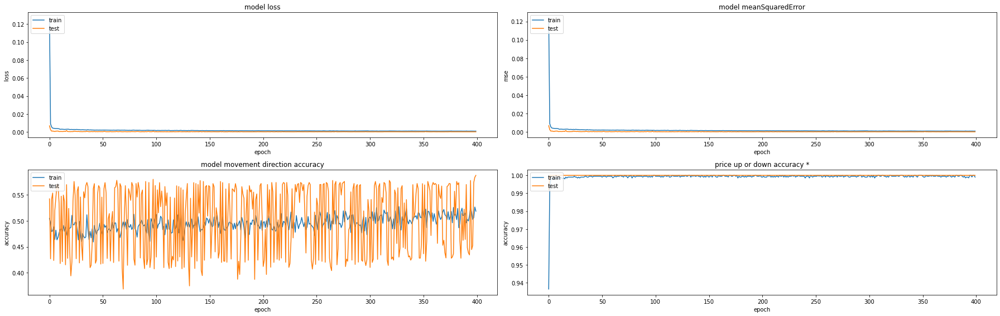

498/498 [==============================] - 3s 7ms/step - loss: 0.0025 - mean_squared_error: 0.0025 - movement_accuracy: 0.4277 - above_or_below_zero_accuracy: 1.0000
treinando fold 4, repetição 2 (400 epochs dá 2min +-)


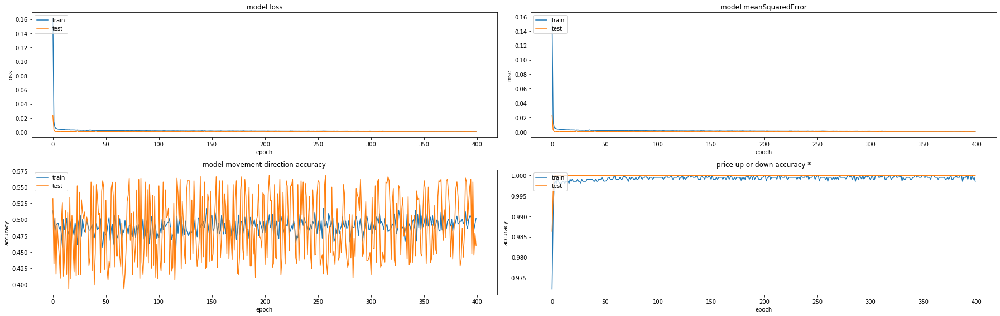

497/497 [==============================] - 3s 7ms/step - loss: 6.7519e-04 - mean_squared_error: 6.7519e-04 - movement_accuracy: 0.5010 - above_or_below_zero_accuracy: 1.0000
treinando fold 5, repetição 1 (400 epochs dá 2min +-)


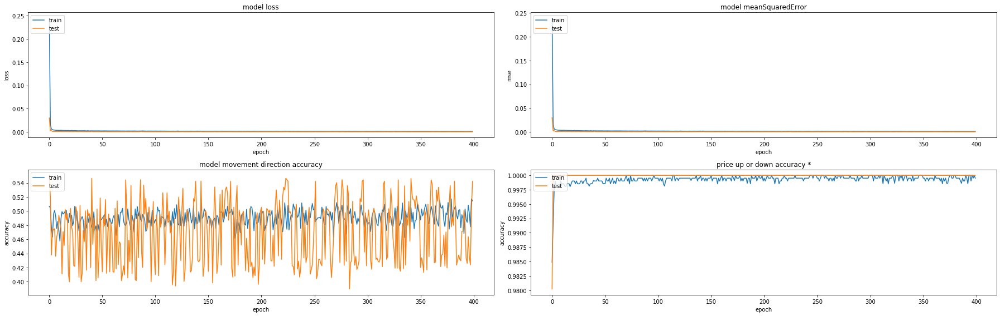

497/497 [==============================] - 4s 7ms/step - loss: 0.0023 - mean_squared_error: 0.0023 - movement_accuracy: 0.5191 - above_or_below_zero_accuracy: 1.0000
treinando fold 5, repetição 2 (400 epochs dá 2min +-)


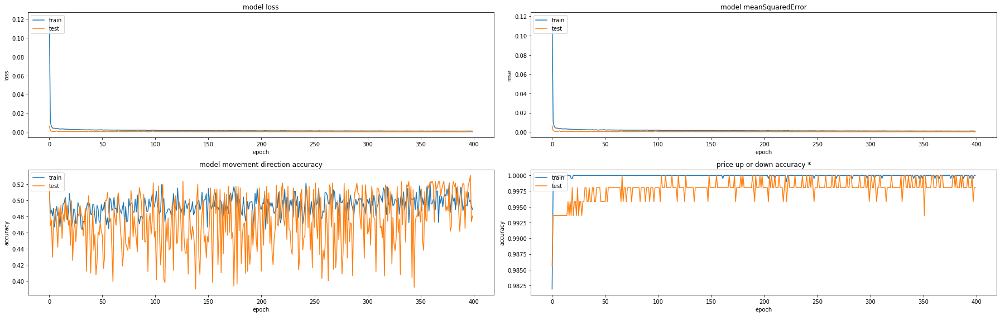

497/497 [==============================] - 3s 7ms/step - loss: 3.4701e-04 - mean_squared_error: 3.4701e-04 - movement_accuracy: 0.4909 - above_or_below_zero_accuracy: 1.0000

Results:

MeanSquaredError: [0.00013936054892838, 0.00012743061233777553, 0.00012296964996494353, 0.00011230444215470925, 0.00022355800319928676, 0.00016873001004569232, 9.833735384745523e-05, 0.00014983188884798437, 0.00020399123604875058, 0.0001082591334125027]
MovementDiretionAccuracy: [0.6285140514373779, 0.5100401639938354, 0.545271635055542, 0.5754527449607849, 0.5352112650871277, 0.5783132314682007, 0.586345374584198, 0.5674044489860535, 0.5492957830429077, 0.5291750431060791]
AboveOrBellowAccuracy: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

MeanSquaredError mean: 0.00014547728787874802
MovementDiretionAccuracy mean: 0.5605023741722107
AboveOrBellowAccuracy mean: 1.0

MeanSquaredError std: 3.956971661117749e-05
MovementDiretionAccuracy std: 0.03225967668953239
AboveOrBellowAccuracy std: 0.0
Esse é 

In [14]:
features = [prices, volume]
target = prices

build_and_run_and_show(features, target, mean_squared_error, epochs = 600)  # nao teve overfitting até o epoch 400, entao bora forçar mais uns pra ver se tira mais ganho
print(f'Esse é o score do {base_coin_fullname_str} num modelo treinado por ele mesmo (mesma moeda, mas trechos de dados diferentes)\n foi usada validação cruzada (K-Fold)')

treinando fold 1, repetição 1 (400 epochs dá 2min +-)


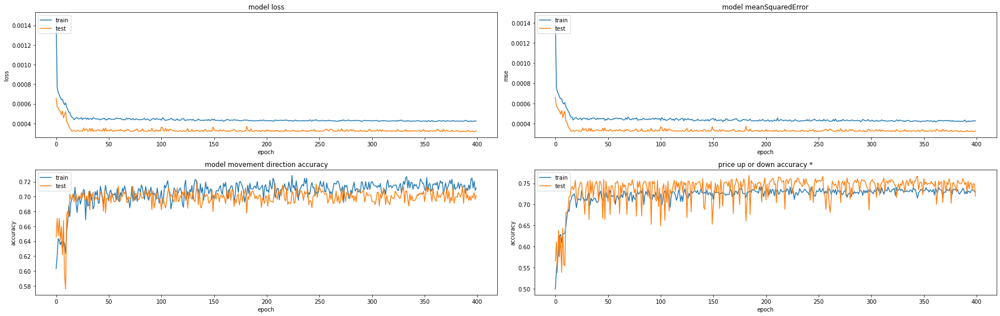

498/498 [==============================] - 4s 7ms/step - loss: 3.2022e-04 - mean_squared_error: 3.2022e-04 - movement_accuracy: 0.7088 - above_or_below_zero_accuracy: 0.7691
treinando fold 1, repetição 2 (400 epochs dá 2min +-)


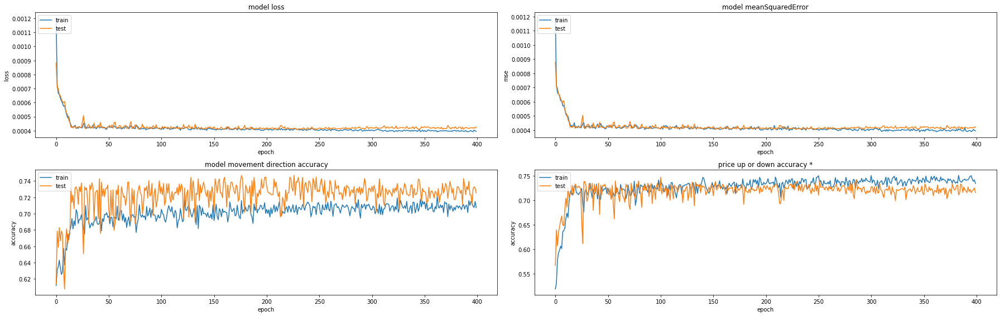

498/498 [==============================] - 3s 7ms/step - loss: 4.1472e-04 - mean_squared_error: 4.1472e-04 - movement_accuracy: 0.7329 - above_or_below_zero_accuracy: 0.7470
treinando fold 2, repetição 1 (400 epochs dá 2min +-)


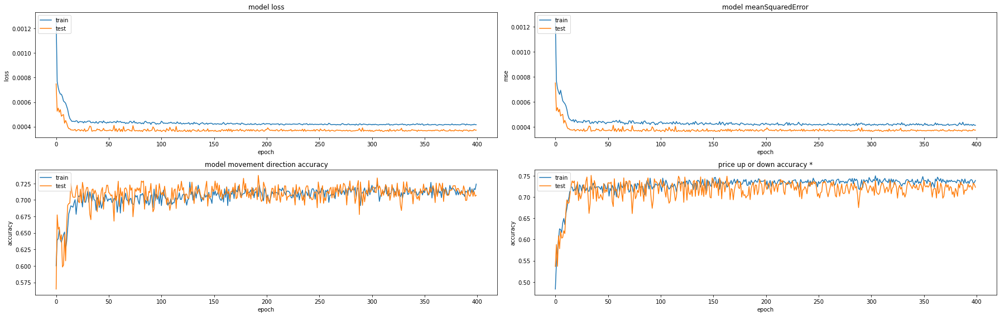

497/497 [==============================] - 3s 7ms/step - loss: 3.6211e-04 - mean_squared_error: 3.6211e-04 - movement_accuracy: 0.7163 - above_or_below_zero_accuracy: 0.7505
treinando fold 2, repetição 2 (400 epochs dá 2min +-)


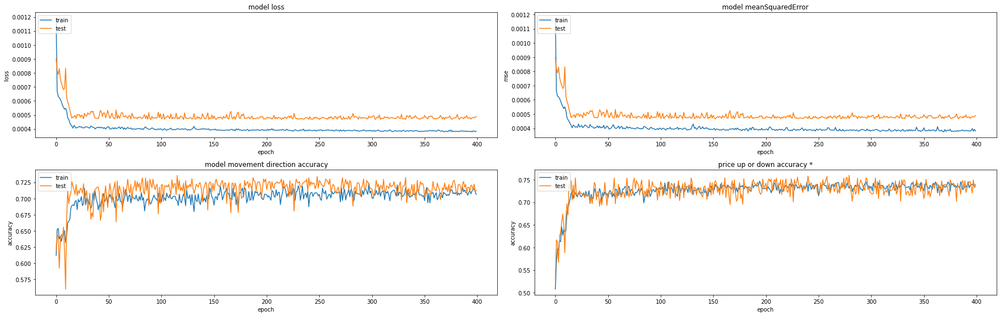

497/497 [==============================] - 3s 7ms/step - loss: 4.6859e-04 - mean_squared_error: 4.6859e-04 - movement_accuracy: 0.7284 - above_or_below_zero_accuracy: 0.7586
treinando fold 3, repetição 1 (400 epochs dá 2min +-)


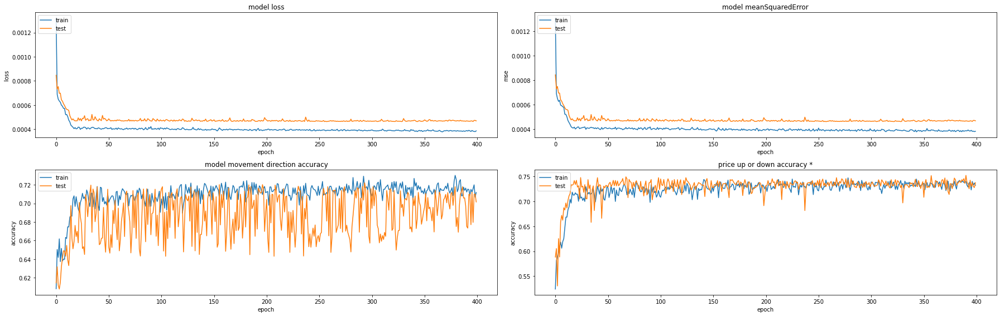

497/497 [==============================] - 3s 7ms/step - loss: 4.6979e-04 - mean_squared_error: 4.6979e-04 - movement_accuracy: 0.6761 - above_or_below_zero_accuracy: 0.7525
treinando fold 3, repetição 2 (400 epochs dá 2min +-)


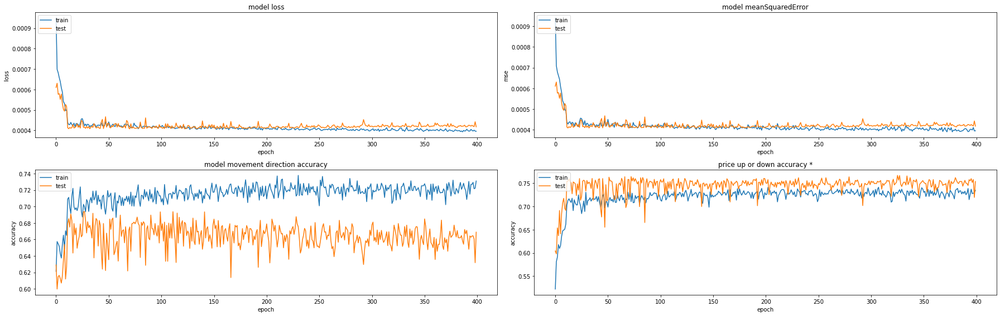

498/498 [==============================] - 3s 7ms/step - loss: 4.2100e-04 - mean_squared_error: 4.2100e-04 - movement_accuracy: 0.6787 - above_or_below_zero_accuracy: 0.7651
treinando fold 4, repetição 1 (400 epochs dá 2min +-)


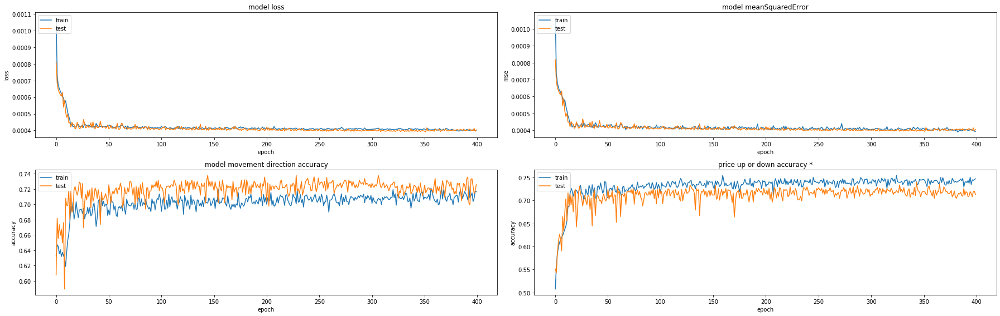

498/498 [==============================] - 3s 6ms/step - loss: 3.9294e-04 - mean_squared_error: 3.9294e-04 - movement_accuracy: 0.7169 - above_or_below_zero_accuracy: 0.7390
treinando fold 4, repetição 2 (400 epochs dá 2min +-)


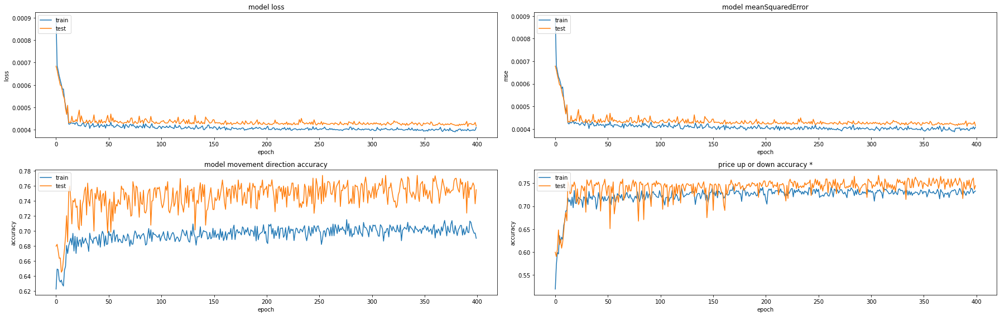

497/497 [==============================] - 3s 7ms/step - loss: 4.2428e-04 - mean_squared_error: 4.2428e-04 - movement_accuracy: 0.7646 - above_or_below_zero_accuracy: 0.7666
treinando fold 5, repetição 1 (400 epochs dá 2min +-)


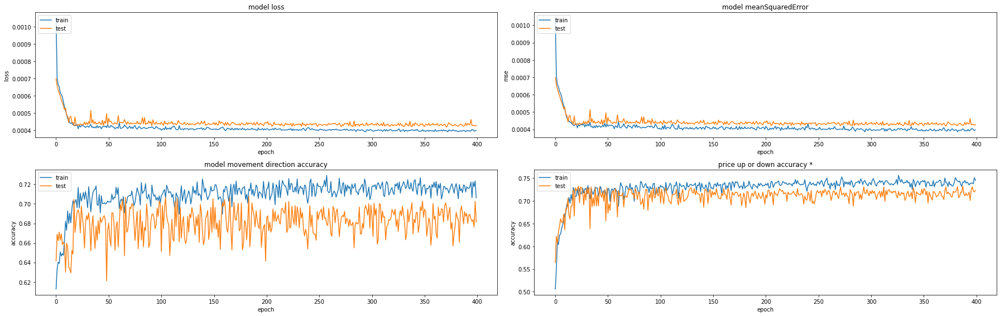

497/497 [==============================] - 3s 7ms/step - loss: 4.2303e-04 - mean_squared_error: 4.2303e-04 - movement_accuracy: 0.6801 - above_or_below_zero_accuracy: 0.7324
treinando fold 5, repetição 2 (400 epochs dá 2min +-)


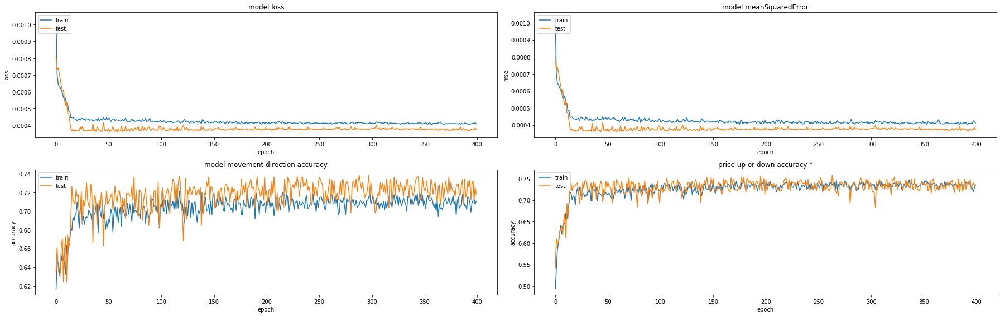

497/497 [==============================] - 3s 7ms/step - loss: 3.8177e-04 - mean_squared_error: 3.8177e-04 - movement_accuracy: 0.7203 - above_or_below_zero_accuracy: 0.7586

Results:

MeanSquaredError: [0.0003146162489429116, 0.0004067951813340187, 0.0003571469569578767, 0.0004667596076615155, 0.00046352698700502515, 0.0004070688155479729, 0.0003915212000720203, 0.0004148622101638466, 0.0004181061522103846, 0.0003623090742621571]
MovementDiretionAccuracy: [0.7208835482597351, 0.7469879388809204, 0.7384305596351624, 0.7364184856414795, 0.7223340272903442, 0.6927710771560669, 0.7389557957649231, 0.7746478915214539, 0.7082495093345642, 0.7404426336288452]
AboveOrBellowAccuracy: [0.7690762877464294, 0.7469879388809204, 0.7505030035972595, 0.758551299571991, 0.7525150775909424, 0.7650602459907532, 0.7389557957649231, 0.7665995955467224, 0.7323943376541138, 0.758551299571991]

MeanSquaredError mean: 0.0004002712434157729
MovementDiretionAccuracy mean: 0.7320121467113495
AboveOrBellowAccurac

In [15]:
features = [variation]
target = variation

build_and_run_and_show(features, target, mean_squared_error, epochs = 600)  # nao teve overfitting até o epoch 400, entao bora forçar mais uns pra ver se tira mais ganho
print(f'Esse é o score do {base_coin_fullname_str} num modelo treinado por ele mesmo (mesma moeda, mas trechos de dados diferentes). Foi usada validação cruzada (K-Fold)')

treinando fold 1, repetição 1 (400 epochs dá 2min +-)


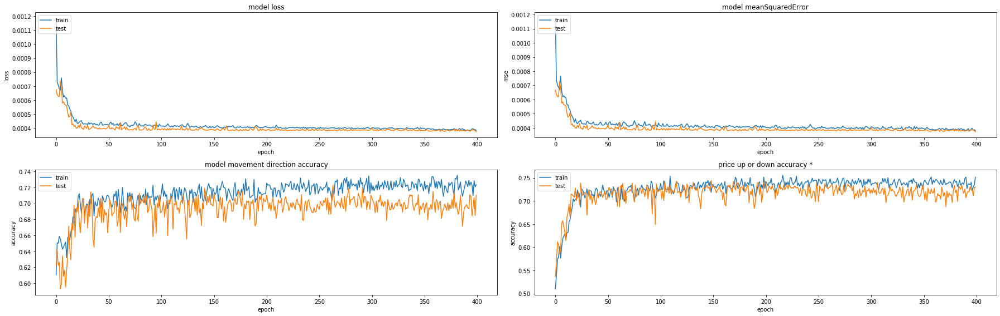

498/498 [==============================] - 3s 7ms/step - loss: 3.9201e-04 - mean_squared_error: 3.9201e-04 - movement_accuracy: 0.6988 - above_or_below_zero_accuracy: 0.7450
treinando fold 1, repetição 2 (400 epochs dá 2min +-)


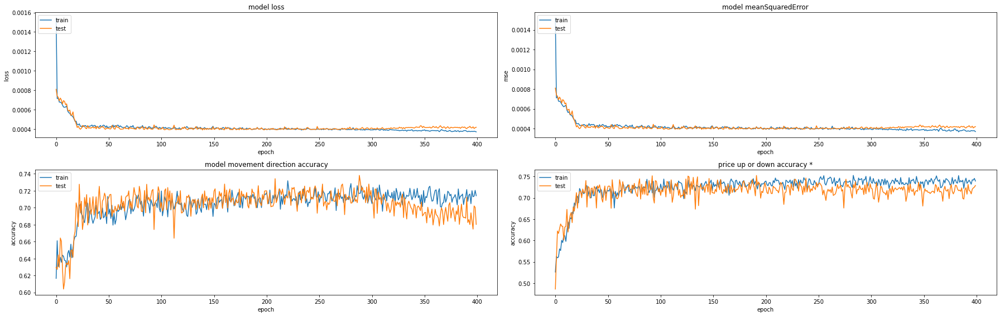

498/498 [==============================] - 4s 7ms/step - loss: 4.1748e-04 - mean_squared_error: 4.1748e-04 - movement_accuracy: 0.7108 - above_or_below_zero_accuracy: 0.7530
treinando fold 2, repetição 1 (400 epochs dá 2min +-)


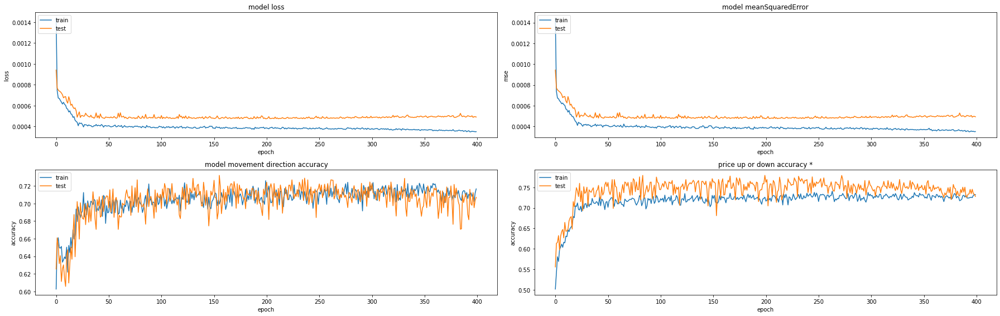

497/497 [==============================] - 4s 7ms/step - loss: 4.8116e-04 - mean_squared_error: 4.8116e-04 - movement_accuracy: 0.7002 - above_or_below_zero_accuracy: 0.7787
treinando fold 2, repetição 2 (400 epochs dá 2min +-)


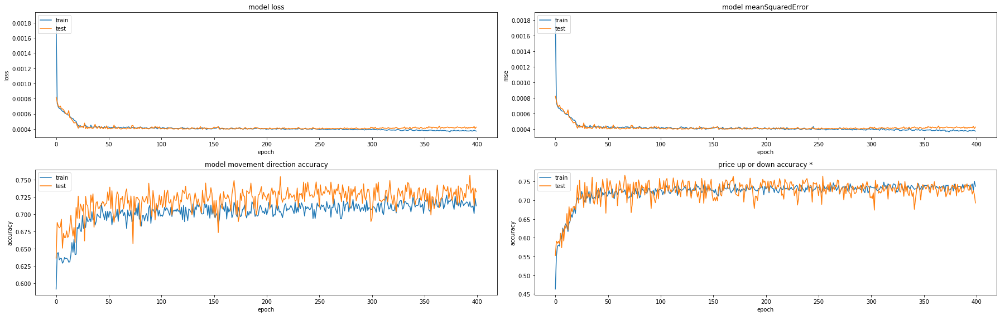

497/497 [==============================] - 3s 7ms/step - loss: 4.0578e-04 - mean_squared_error: 4.0578e-04 - movement_accuracy: 0.7324 - above_or_below_zero_accuracy: 0.7666
treinando fold 3, repetição 1 (400 epochs dá 2min +-)


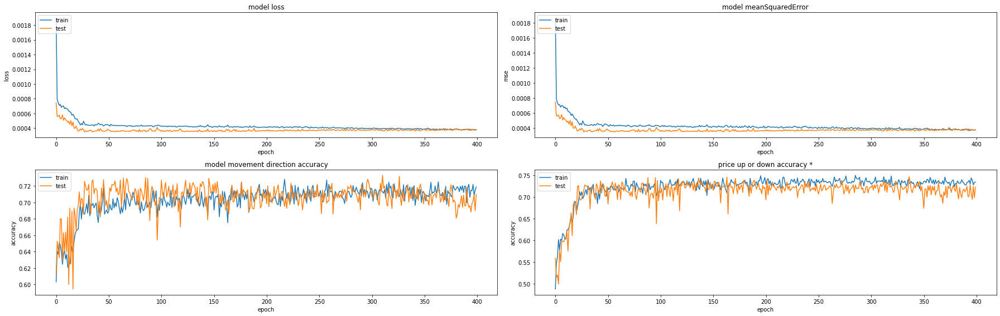

497/497 [==============================] - 3s 7ms/step - loss: 3.7657e-04 - mean_squared_error: 3.7657e-04 - movement_accuracy: 0.7143 - above_or_below_zero_accuracy: 0.7465
treinando fold 3, repetição 2 (400 epochs dá 2min +-)


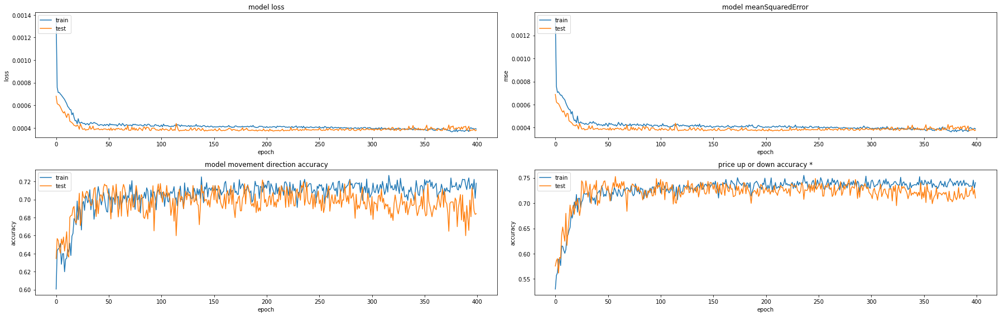

498/498 [==============================] - 4s 7ms/step - loss: 3.9375e-04 - mean_squared_error: 3.9375e-04 - movement_accuracy: 0.7189 - above_or_below_zero_accuracy: 0.7530
treinando fold 4, repetição 1 (400 epochs dá 2min +-)


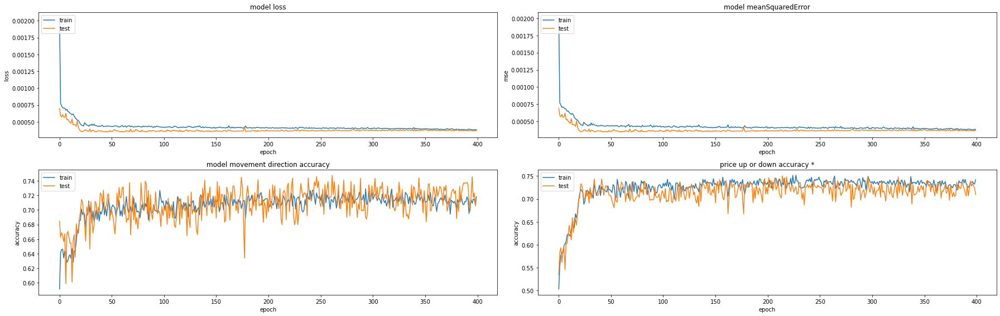

498/498 [==============================] - 3s 7ms/step - loss: 3.6681e-04 - mean_squared_error: 3.6681e-04 - movement_accuracy: 0.7249 - above_or_below_zero_accuracy: 0.7510
treinando fold 4, repetição 2 (400 epochs dá 2min +-)


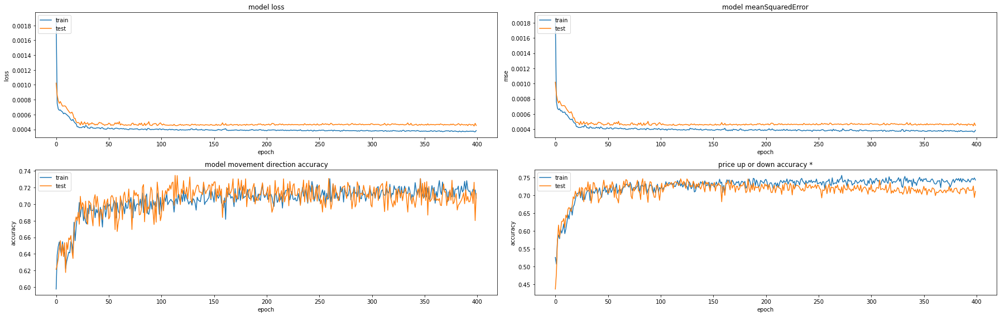

497/497 [==============================] - 3s 7ms/step - loss: 4.5347e-04 - mean_squared_error: 4.5347e-04 - movement_accuracy: 0.7264 - above_or_below_zero_accuracy: 0.7465
treinando fold 5, repetição 1 (400 epochs dá 2min +-)


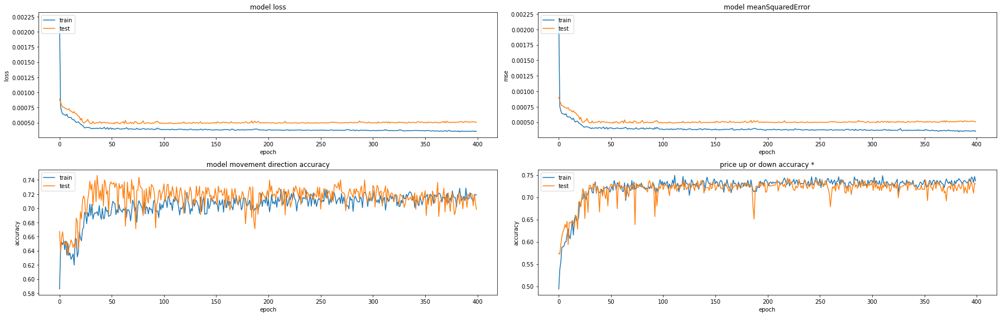

497/497 [==============================] - 3s 7ms/step - loss: 4.9607e-04 - mean_squared_error: 4.9607e-04 - movement_accuracy: 0.7264 - above_or_below_zero_accuracy: 0.7425
treinando fold 5, repetição 2 (400 epochs dá 2min +-)


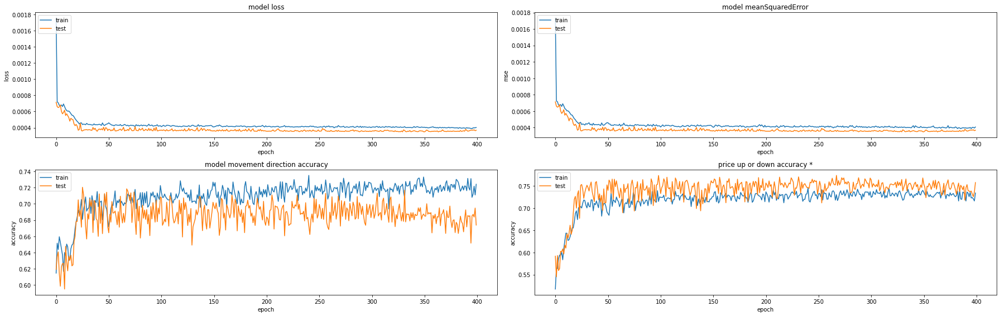

497/497 [==============================] - 3s 7ms/step - loss: 3.5431e-04 - mean_squared_error: 3.5431e-04 - movement_accuracy: 0.6881 - above_or_below_zero_accuracy: 0.7746

Results:

MeanSquaredError: [0.00037347711622714996, 0.00039262548671104014, 0.0004738803836517036, 0.00039691480924375355, 0.0003491750394459814, 0.0003703276452142745, 0.0003511220565997064, 0.00044517521746456623, 0.0004816161235794425, 0.00034892611438408494]
MovementDiretionAccuracy: [0.7228915691375732, 0.7389557957649231, 0.7323943376541138, 0.7565392255783081, 0.7344064116477966, 0.7228915691375732, 0.7469879388809204, 0.7364184856414795, 0.7464788556098938, 0.7203219532966614]
AboveOrBellowAccuracy: [0.7449799180030823, 0.7530120611190796, 0.7786720395088196, 0.7665995955467224, 0.7464788556098938, 0.7530120611190796, 0.7510040402412415, 0.7464788556098938, 0.7424547076225281, 0.7746478915214539]

MeanSquaredError mean: 0.00039832399925217034
MovementDiretionAccuracy mean: 0.7358286142349243
AboveOrBellow

In [16]:
features = [variation, volume_variation]
target = variation

build_and_run_and_show(features, target, mean_squared_error, epochs = 600)  # nao teve overfitting até o epoch 400, entao bora forçar mais uns pra ver se tira mais ganho
print(f'Esse é o score do {base_coin_fullname_str} num modelo treinado por ele mesmo (mesma moeda, mas trechos de dados diferentes). Foi usada validação cruzada (K-Fold)')